## Overview of Cars24 Data

### Introduction to use case

- Let's continue with our usecase of Cars24 data.
- Our task is to **predict the resale price of the cars**.
- Note that resale price is a **continuous numeric** value.

\
#### Would this be a classification or regression problem?

Regression.



# Question
What do you think about the nature of this problem?

# Choices
- [x] Regression
- [ ] Classification
- [ ] Clustering

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [10]:
!gdown 1bwRmKkPwmLKiqOgQ_LnKH0Vsc3mJKmVR

Downloading...
From: https://drive.google.com/uc?id=1bwRmKkPwmLKiqOgQ_LnKH0Vsc3mJKmVR
To: /content/cars24-car-price-cleaned.csv
100% 1.69M/1.69M [00:00<00:00, 160MB/s]


In [11]:
df = pd.read_csv('cars24-car-price-cleaned.csv')
df.head()

,selling_price,year,km_driven,mileage,engine,max_power,age,make,model,Individual,Trustmark Dealer,Diesel,Electric,LPG,Petrol,Manual,5,>5
0,1.20,2012.0,120000,19.70,796.0,46.30,11.0,MARUTI,ALTO STD,1,0,0,0,0,1,1,1,0
1,5.50,2016.0,20000,18.90,1197.0,82.00,7.0,HYUNDAI,GRAND I10 ASTA,1,0,0,0,0,1,1,1,0
2,2.15,2010.0,60000,17.00,1197.0,80.00,13.0,HYUNDAI,I20 ASTA,1,0,0,0,0,1,1,1,0
3,2.26,2012.0,37000,20.92,998.0,67.10,11.0,MARUTI,ALTO K10 2010-2014 VXI,1,0,0,0,0,1,1,1,0
4,5.70,2015.0,30000,22.77,1498.0,98.59,8.0,FORD,ECOSPORT 2015-2021 1.5 TDCI TITANIUM BSIV,0,0,1,0,0,0,1,1,0


Now if we see,
- `make` and `model` columns
- still have categorical data.

You must've read about **target variable encoding** in the postread. </br>
Let's revisit that.

### Target variable encoding

In [8]:
df['model'].nunique(), df['make'].nunique()

(3233, 41)

Notice,

- there are a lot of categories in both `model` and `make`.

\
Use **One Hot Encoding** here can result in a lot of dimensions,
- facing us with the **curse of dimensionality**.

\
Hence, we use a technique called **Target Variable Encoding**.

Target encoding replaces the categories with a number representing the average target value associated with each category.

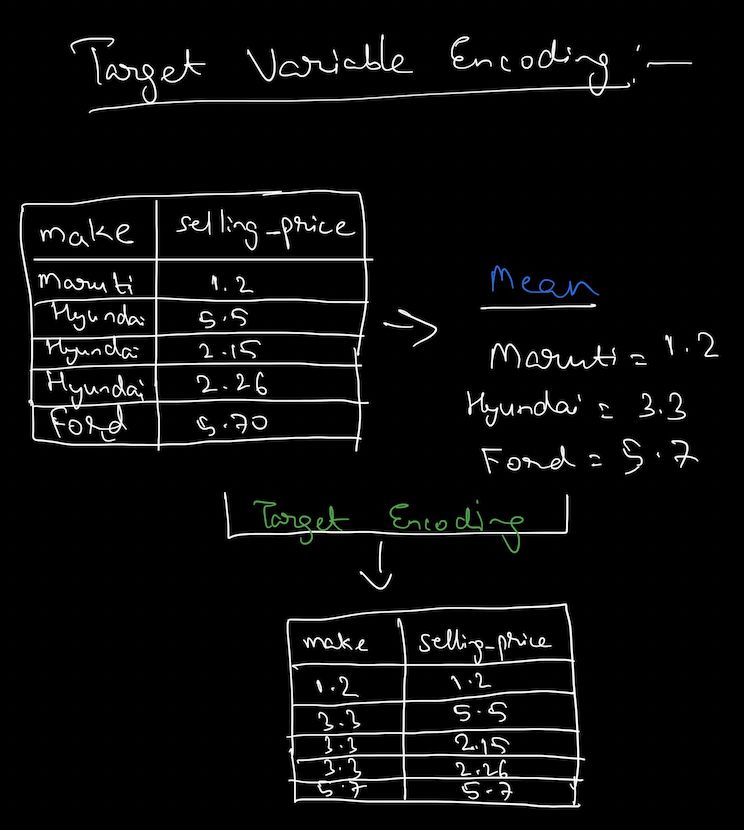

If we take `make` and `selling_price` columns, </br>
We see:

- Maruti has only one value, so the mean would be 1.2
- Hyundai has 3 values, with the mean being 3.3
- Ford has 1 value again, with the mean being 5.7

So we just replace the respective category name with it's mean.


**Quiz** (Check your knowledge)

Q: How do you think we should handle the large number of categories in make and model column?
- [ ] One Hot Encoding
- [ ] Label Encoding
- [x] Target Variable Encoding


For our data,
- we will be using **mean** to encode the columns.

In [12]:
df['make'] = df.groupby('make')['selling_price'].transform('mean')
df['model'] = df.groupby('model')['selling_price'].transform('mean')
df.head()

,selling_price,year,km_driven,mileage,engine,max_power,age,make,model,Individual,Trustmark Dealer,Diesel,Electric,LPG,Petrol,Manual,5,>5
0,1.20,2012.0,120000,19.70,796.0,46.30,11.0,4.684721,1.180000,1,0,0,0,0,1,1,1,0
1,5.50,2016.0,20000,18.90,1197.0,82.00,7.0,5.458819,4.818750,1,0,0,0,0,1,1,1,0
2,2.15,2010.0,60000,17.00,1197.0,80.00,13.0,5.458819,3.394000,1,0,0,0,0,1,1,1,0
3,2.26,2012.0,37000,20.92,998.0,67.10,11.0,4.684721,2.242676,1,0,0,0,0,1,1,1,0
4,5.70,2015.0,30000,22.77,1498.0,98.59,8.0,5.858258,6.777576,0,0,1,0,0,0,1,1,0


### Scaling the data -

Notice one more thing:

- `km_driven` is in the ranges of 10000s,
- while `age` is in the range of 10s.

\
#### So, what's the problem with that?

- The unit of measurement for both the features are different.
- This would create a problem later while analyzing the model.
- Hence we need to scale our data before training the model with it.



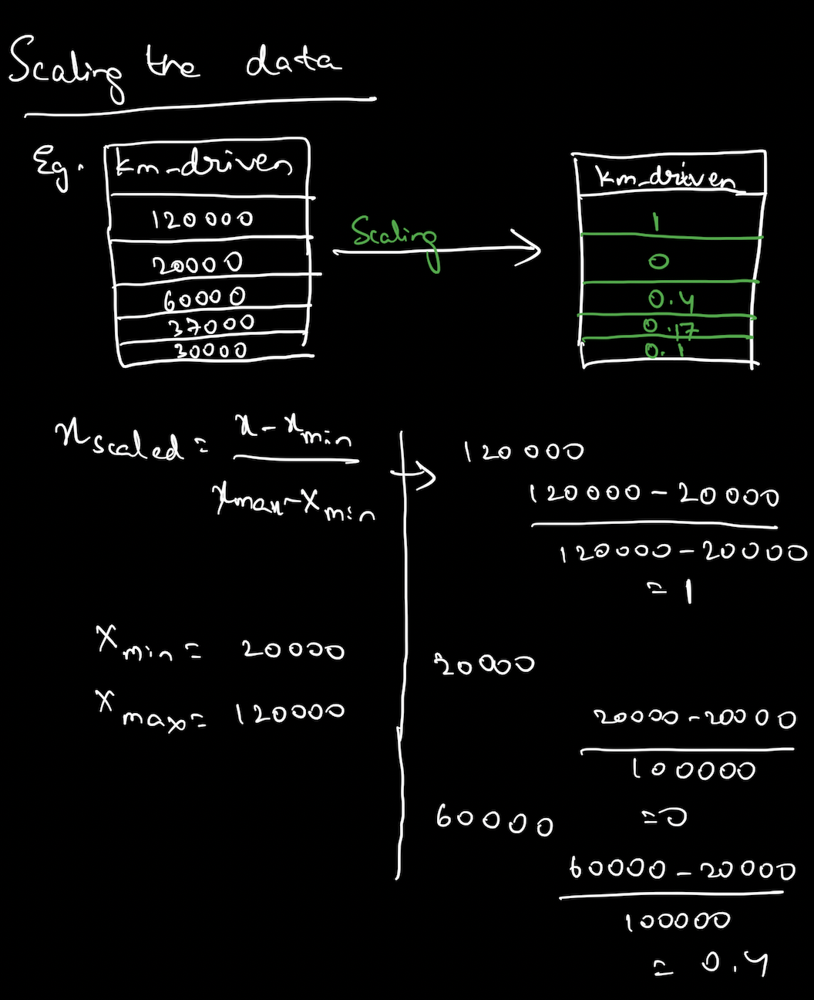

We will be using **MinMaxScaler** for our data.

\
The formula goes like: </br>
$x_{scaled} = \frac{x-x_{min}}{x_{max}-x_{min}}$

\
Where:
- $x$ is the datapoint.
- $x_{min}$ is the minimum value of the data.
- $x_{max}$ is the maximum value of the data.

\
**Note:** </br>
Later in the lecture we will see why scaling was so important.

**Tip:** </br>
Apart from MinMaxScaler, you can also try out various methods to see which works the best.

In [13]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

df = pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
df.head()

,selling_price,year,km_driven,mileage,engine,max_power,age,make,model,Individual,Trustmark Dealer,Diesel,Electric,LPG,Petrol,Manual,5,>5
0,0.043684,0.689655,0.031553,0.135345,0.117891,0.066506,0.310345,0.194048,0.041550,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0
1,0.252397,0.827586,0.005237,0.128448,0.177281,0.123994,0.172414,0.232517,0.218382,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0
2,0.089795,0.620690,0.015764,0.112069,0.177281,0.120773,0.379310,0.232517,0.149143,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0
3,0.095134,0.689655,0.009711,0.145862,0.147808,0.100000,0.310345,0.194048,0.093193,1.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0
4,0.262104,0.793103,0.007869,0.161810,0.221860,0.150709,0.206897,0.252367,0.313574,0.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0


**Quiz** (Check your knowledge)
```
Q: What is the range of values after applying min-max scaling?
a) -1 to 1.
b) 0 to 1.
c) -∞ to +∞.
d) Any arbitrary range specified by the user.

A: b) 0 to 1.
```

## Data Notation

### Supervised Learning Revision

We did learn about **supervised** and **unsupervised** learning algorithms in our last class.

#### What kind of problem do you think our current usecase would fall under?

Let's look at the data:
- Does it have labels? **Yes**

Well, this puts the data under the "supervised" learning category.

### Data Notation

Let's look at few notations we will be following throughout machine learning.

<img src="https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/036/832/original/image_2023-06-14_170643599.png?1686742605" height=700 width=600>

**$m$** $\rightarrow$ no. of samples </br>
**$d$** $\rightarrow$ no. of features </br>
**$n$** $\rightarrow$ no. of classes

\
**Data Notation**
- Data $X: (m,d)$
- $i^{th} \ sample: X^{(i)}$
- $j^{th} \ feature: X_j$
- Target: $(m,1)$
	- [Can convert to $(m, n)$ for Softmax using preprocessing]
- Actual output: $y^{(i)}$
- Predicted output: $\hat{y}^{(i)}$

\
**Parameter Notation**

$w=\begin{bmatrix}
	w_0 \\
	w_1 \\
	w_2 \\
  . \\
  . \\
  w_d
	\end{bmatrix}$

Don't get intimidated by the terms,
- we will go through all of them as we proceed with this module.

## Goal of ML: Generalization

#### Should we train our model on all of the data?

**No**

The ultimate goal of our model should be able to perform well on unseen data.

\
For this reason,
- to generalize our model well,
- we follow the practice of splitting our data into sets:
  - One for training
  - One for testing



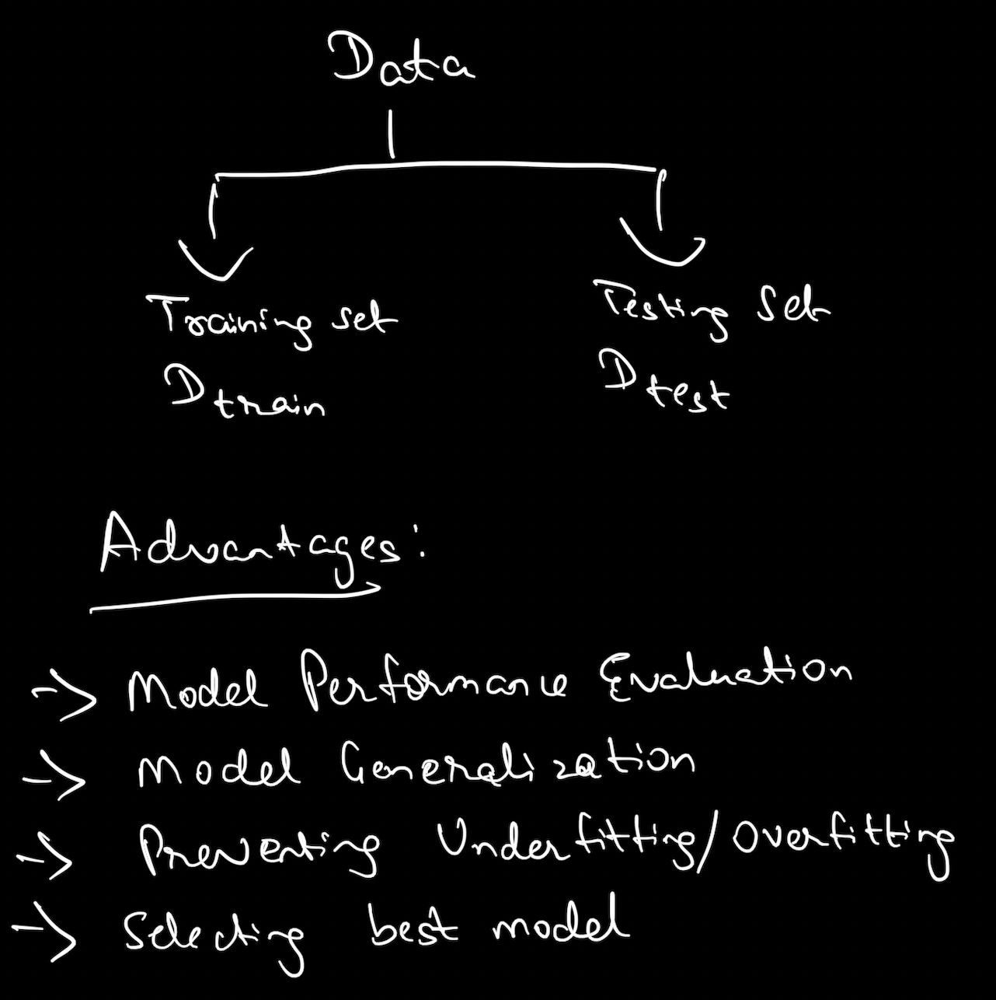

This helps in multiple ways:
- Evaluating the performance of the model
- Selecting the best model among multiple choices
- Checking for model underfitting/overfitting (we will learn about this soon)
- Generalization of the model

**Quiz** (What do you think?)
```
Q: When should you split your data into training and testing sets?
a) Before preprocessing the data.
b) After training the model.
c) After evaluating the model's performance.
d) Before training the model.

A: d) Before training the model.
```

Now let's see how we can split our data.

We will be using sklearn's `test_train_split` function for this.

In [14]:
from sklearn.model_selection import train_test_split

From our data:
- The output data, `y` is the column `selling_price`
- Remaining columns are the input data, `X`

In [15]:
y = df['selling_price']
X = df.drop('selling_price', axis=1)
y.shape, X.shape

((19820,), (19820, 17))

So we have to,
- predict 1 output feature
- using 17 input features.


Now let's split the data.

We will divide it into 70:30 ratio:
- 70% for training,
- and 30% for testing.

In [16]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=1)

In [17]:
X_train.shape, y_train.shape

((13874, 17), (13874,))

In [18]:
X_test.shape, y_test.shape

((5946, 17), (5946,))

We will use
- `X_train` and `y_train` to train our model,
- and `X_test` and `y_test` to evaluate the model's performance.

## Linear Regression Intuition

### Univariate

Since our training data is ready now,
- let's finally start developing our model.

Let's understand Linear Regression for a **single variable**.

Suppose we want to predict the price of car from it's age.


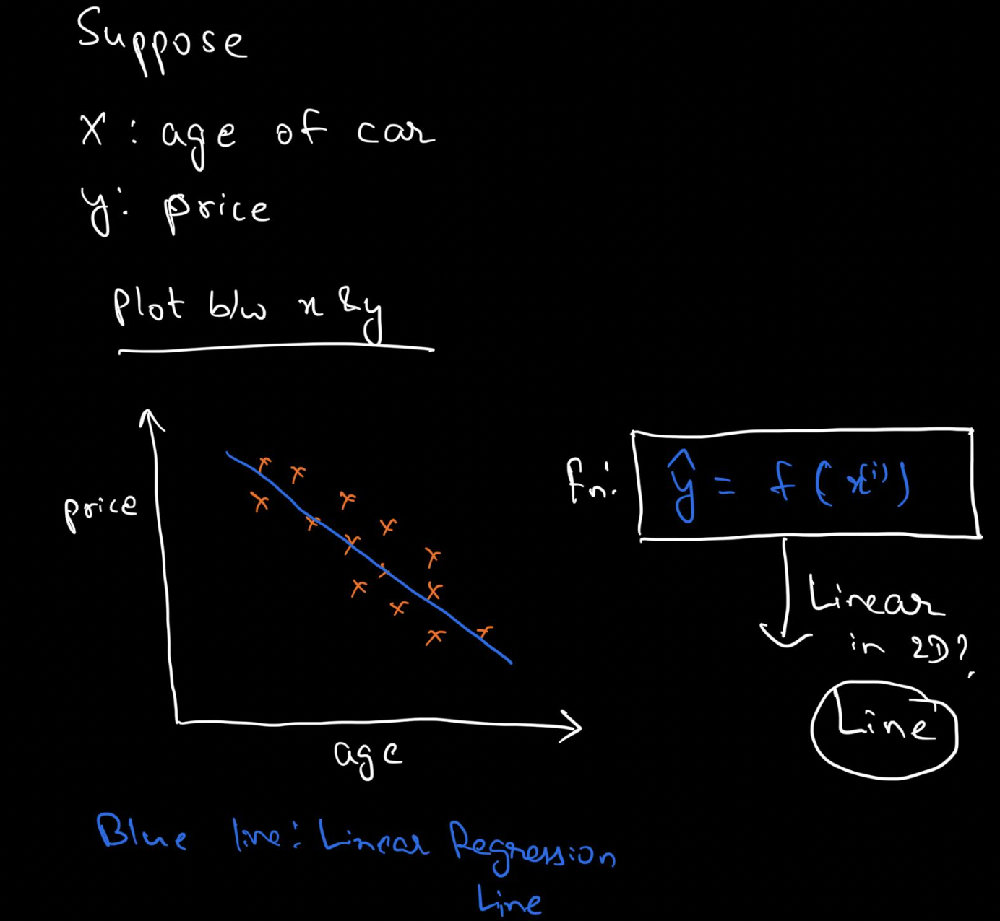

As we know, </br>
the price decreases as the age of the vehicle increases.

\
- How will our  model look like?
  - Our model is a function trying to map the `age` and `price` columns.
  - So, $\hat{y} = f(x^{(i)})$
  - Here,
    - $\hat{y}$ is our predicted value.
    - $x^{(i)}$ is a sample data point as input.
    - f is a function mapping the input & output.

- How will our model look like in 2D?
  - Notice, it looks very similar to a straight line.
  - So the equation would be $\hat{y} = w_1x_1^{(i)}+w_0$
  - Here, $w_1 \ and \ w_0$ are the weights and bias respectively.
  - Recall, we learnt this in Maths for ML module.
- This is similar to `y = mx + c`.

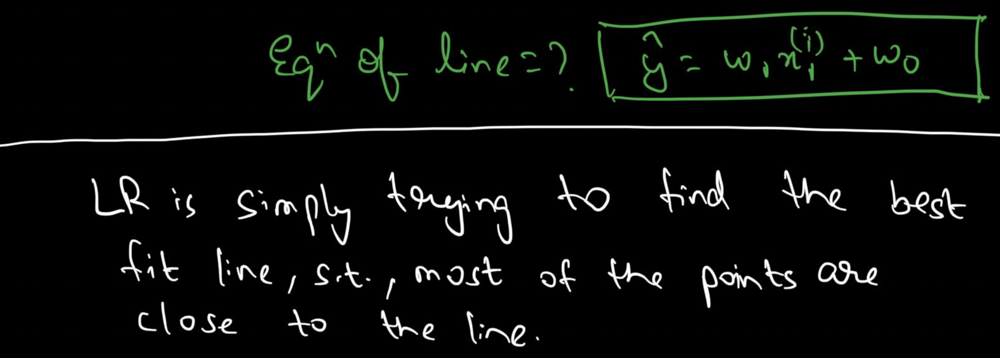

Geometrically,
- Linear Regression is trying to find a line such that most of the points are close to the line.

**Quiz** (Check your knowledge)

```
Q: How many parameters do you need to estimate in a simple linear regression model
(one independent variable)?

a) 1
b) 2
c) Can’t say

A: c) 2

Explanation:
- In simple linear regression, there is one independent variable so 2 coefficients (Y=a+bx).
```

### Multivariate

Now let's see the same for multiple features.

Let's take two features, `age` and `odometer_reading`.

\
#### What would be the linear function for this case, in 3D?
- A plane

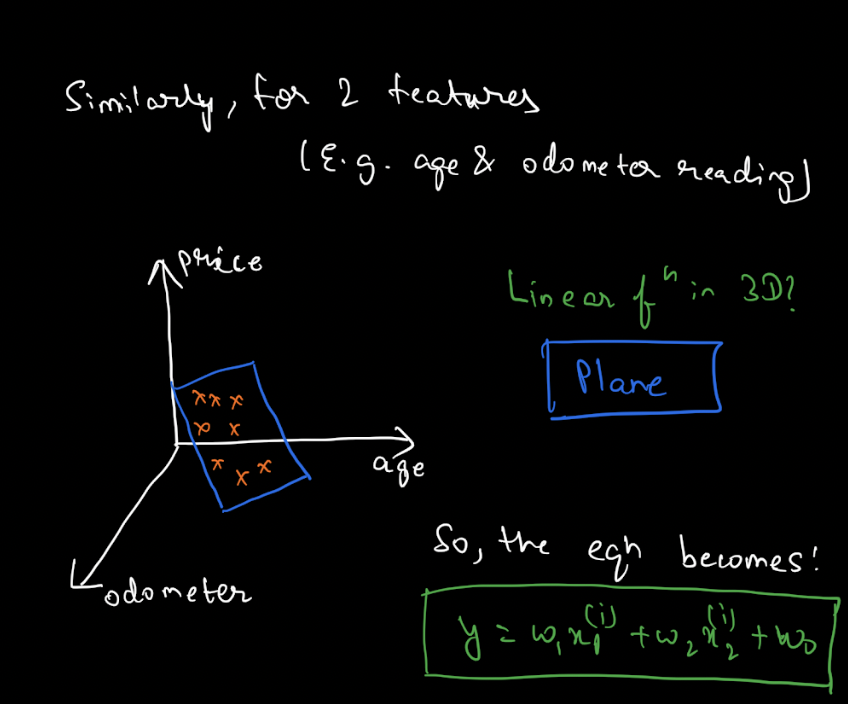

So the equation becomes: </br>
$\hat{y} = w_1x_1^{(i)}+w_2x_2^{(i)}+w_0$

\
Similarly, </br>
for d-features:

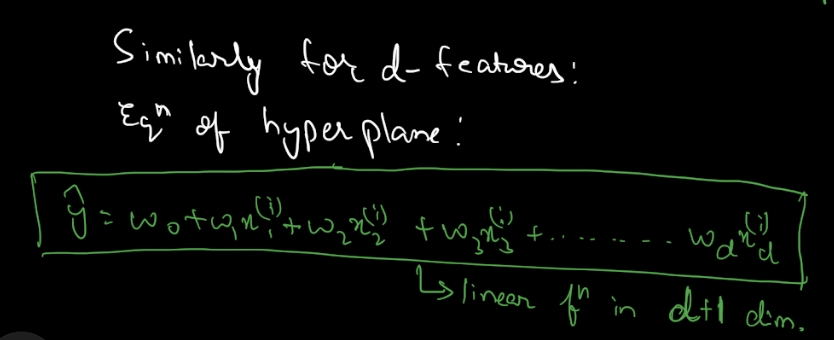

Equation of hyperplane: </br>
$\hat{y} = w_0+w_1x_1^{(i)}+w_2x_2^{(i)}+w_3x_3^{(i)}+....+w_dx_d^{(i)}$

\
#### So, what does Linear Regression do exactly?

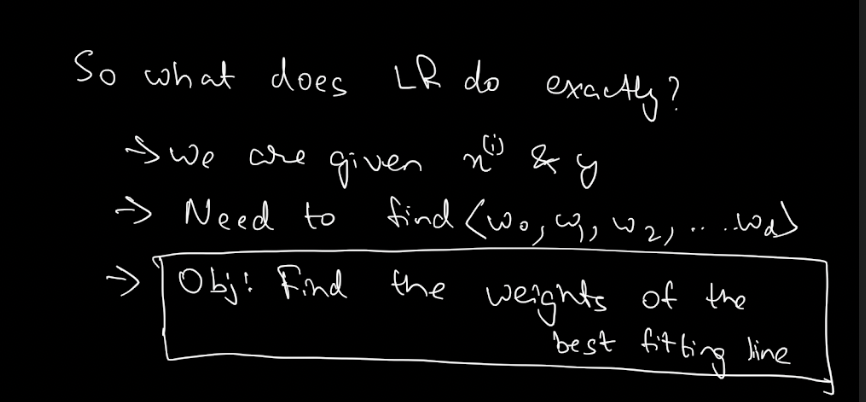

**Quiz** (Check your knowledge)
```
Q: If your data contains d features,
how many dimensions will be required to fit the hyperplane through that data?

a) D
b) D + 1
c) D - 1
d) 2 * D

A: b) D + 1
```

## Lin Reg using sklearn






### Univariate

Let's first take a single variable and train our model.

In [19]:
X1=X[['model']]
X1_train = X_train[['model']]
X1_test = X_test[['model']]

In [20]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X1_train, y_train)

LinearRegression()

In [21]:
model.coef_

array([0.9967642])

In [22]:
model.intercept_

0.0015237505846132926

In [23]:
y_hat = model.predict(X1)

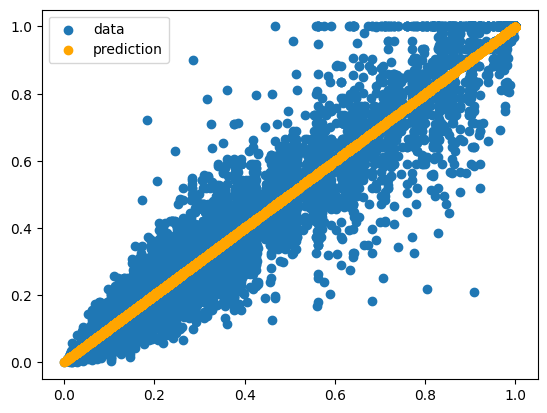

In [24]:
fig = plt.figure()
plt.scatter(X1,y,label='data')
plt.scatter(X1,y_hat,color='orange',label='prediction')
plt.legend()
plt.show()

Notice,
- how the predicted values form a line similar to a regression line.

### Multivariate

Let's now generalize our model for the whole data.

In [25]:
print(X.shape, y.shape)

(19820, 17) (19820,)


In [26]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model.fit(X_train, y_train)

LinearRegression()

In [27]:
model.coef_

array([ 7.23382199e+11, -2.50488281e-01, -2.32558310e-01,  7.39953774e-02,
        4.68742062e-02,  7.23382199e+11,  6.61604471e-02,  8.58973267e-01,
       -7.18488746e-03, -7.03116019e-03,  6.98577387e-03,  1.32957359e-01,
        1.50077817e-02, -6.83704171e-03, -3.69616522e-03, -1.62563011e-02,
       -2.35725832e-02])

In [28]:
model.intercept_

-723382198910.7482

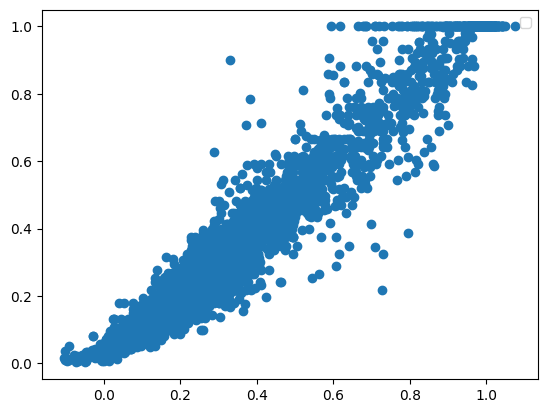

In [29]:
import matplotlib.pyplot as plt
fig = plt.figure()
y_hat = model.predict(X_test)
plt.scatter(y_hat,y_test)
plt.legend()
plt.show()

## Evaluation Metric

Finally,
- we've built our model, and
- it's predicting the data well.

#### But is there a way to measure the performance of our model?

Let's break down the problem.

\
We want to minimize the distance between
- the predicted point and
- the actual point.

The closer the predicted value to the actual value, the better is the model.

\
So, for multiple points
- it will be the sum of the error divided by $m$: $\frac{1}{m}\sum^{m}_{i=0}\hat{y}-y^{(i)}$

\
#### Can we use sum of the errors as a metric?

**No**

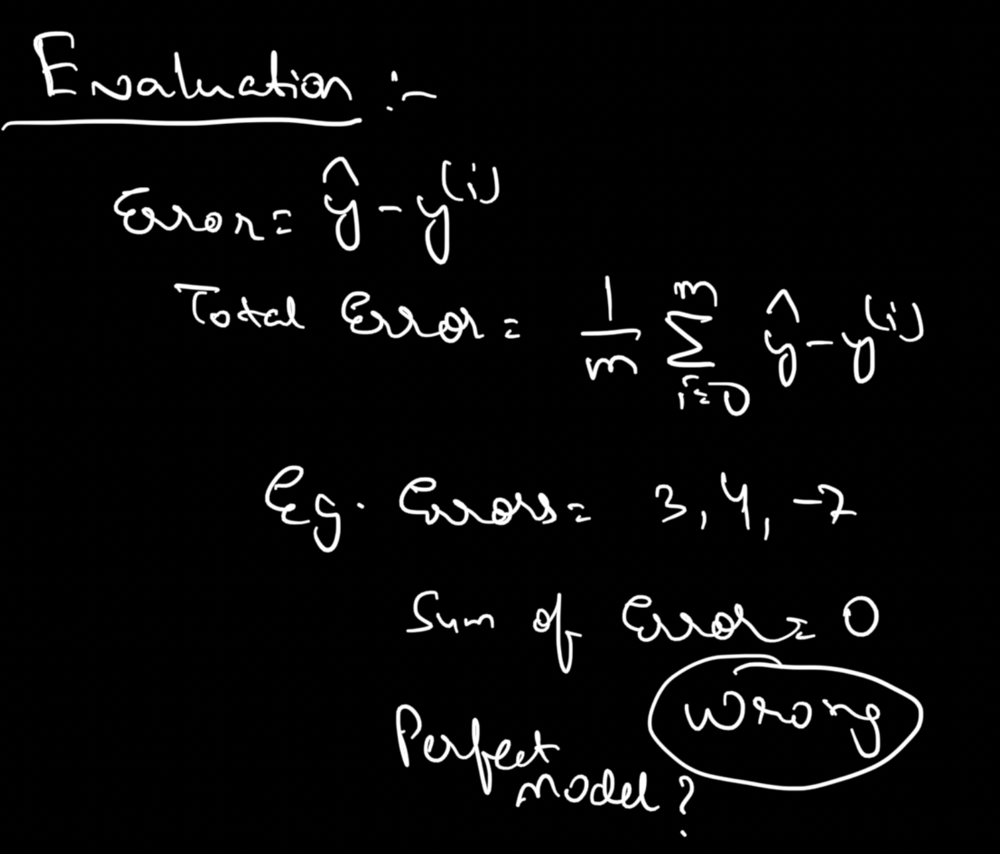

Suppose we have 3 data points,
- and we get the errors as: </br> <3, 4, -7>

Now, sum of these errors will be 0.

\
This basically means our model is error free. </br>
But that is not the case.

\
#### How can we solve this issue?

There are two ways:


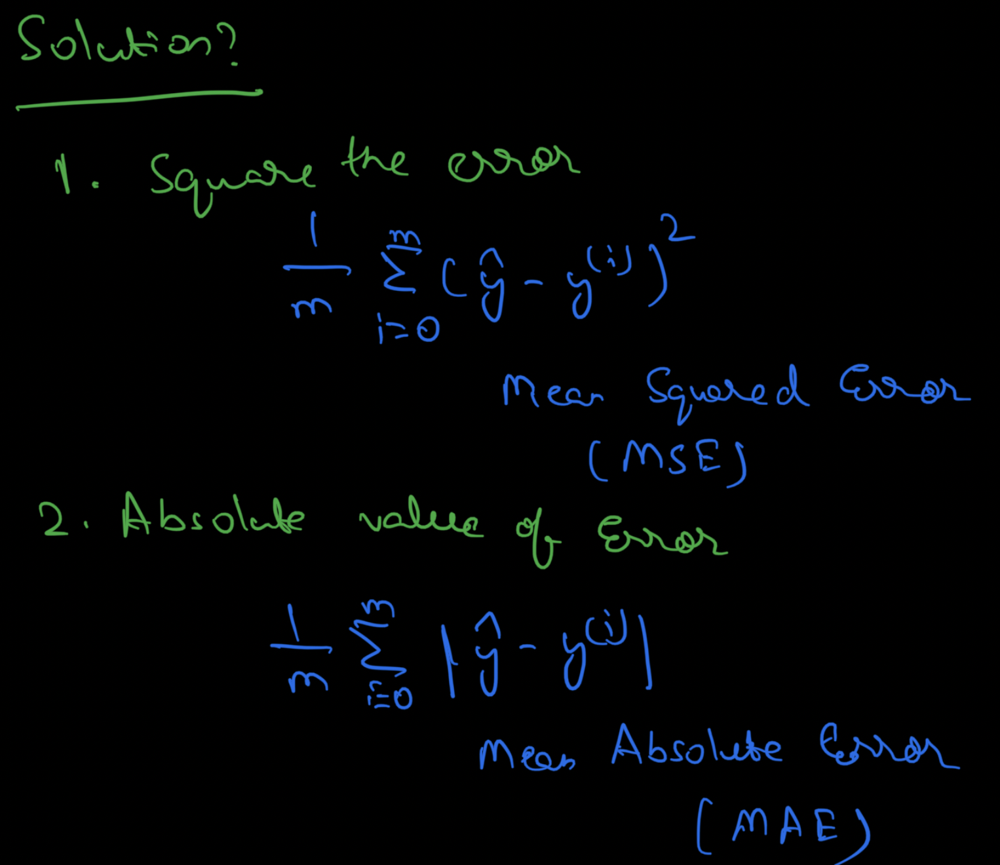

1. We can take the squares of the errors: $\frac{1}{m}\sum^{m}_{i=0}(\hat{y}-y^{(i)})^2$ </br> called MSE (Mean Squared Error)

2. We can take the absolute value of the errors: $\frac{1}{m}\sum^{m}_{i=0}|\hat{y}-y^{(i)}|$ </br> called MAE (Mean Absolute Error)


**Note:** </br>
We will be using the above functions later to understand how Linear Regression works under the hood, </br> and the optimization behind it.

**Quiz** (What do you think?)
```
Q: In linear regression, if the MSE value is 0, it indicates:

a) The predicted values perfectly match the actual values.
b) The model has no predictive power and fails to explain the dependent variable.
c) The model has high bias and underfits the data.
d) The model has high variance and overfits the data.

A: a) The predicted values perfectly match the actual values.
```

**Quiz** (Check your knowledge)

```
Q: How does increasing MSE affect the quality of a regression model?

a) Higher MSE indicates better model performance.
b) Higher MSE indicates worse model performance.
c) MSE does not reflect model quality.
d) MSE only measures the significance of predictor variables.

A: b) Higher MSE indicates worse model performance.
```

**Quiz** (Check your knowledge)

```
Q: A model built to predict the sales for a business in the next annual cycle,
has a large negative MSE value on evaluation. What does this mean?

a) Poor model fit
b) Great model fit
c) Can’t be said

A: a) Poor model fit
```

There is one issue with MSE or MAE, it gives a value between 0 to $∞$

The value can vary depending on the range of values predicted.
- This means, the values can be in 100s, 1000s, or 10000s, depending the range of the output data

#### So the questions arises, how small of an MSE is good enough?
 Is 1 a good mse score, or 10, or 100?


This makes a problem since there is no common scale/range to measure the performance.

#### Here we can use a metric called: "R2 Score", or the "coefficient of determination"

#### What is R2 Score, or the coefficient of determination?

The R2 score tells us how well a regression model fits the data.

\
It shows the percentage of the variation in the outcome variable that can be explained by the predictors.

$R^2 Score$ can be defined as: </br>
$1 - \frac{SS_{res}}{SS_{total}}$

\
- A higher R2 score means the model is a good fit,
- while a lower score means it's not as accurate.



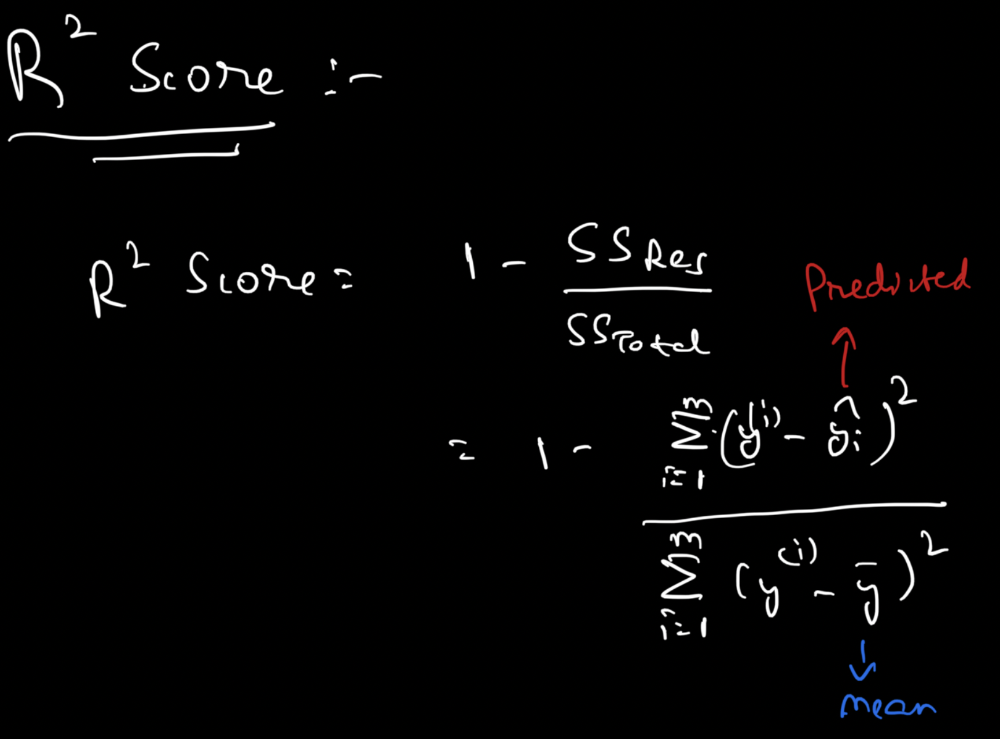

Where,
- $SS_{res} = \frac{1}{m}\sum^{m}_{i=0}(y^{(i)}-\hat{y})^2$
- $SS_{total} = \frac{1}{m}\sum^{m}_{i=0}(y^{(i)}-\bar{y})^2$
  - $\bar{y}$ being the mean of all $y$ values

\
We take mean as,
- if a model is able to predict everything as the mean value,
- it can be called a dumb model.

Our measurement here would be with respect to this "dumb model".



Let's understand this in a little more depth.

\
Suppose we plot the points between `y_true` and `y_pred`.

- The red line denotes the predicted regression model.
- The blue line denotes the mean values.

\
Now,
- $SS_{res}$ denotes the sum of squared erros of the points from the line,
- while $SS_{total}$ denotes the same from the mean.

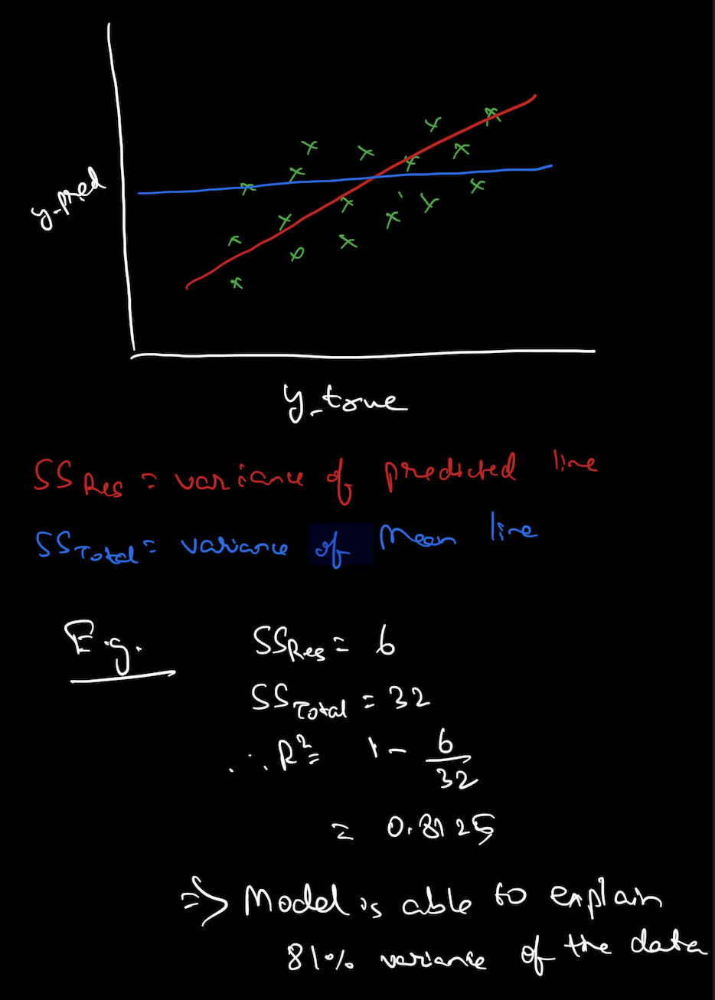

In other words,
- $SS_{res}$ explains the variance of predicted line,
- $SS_{total}$ explains the variance of mean line.

\
Let's take an example:
- $SS_{res}$ = 6
- $SS_{total}$ = 32

\
So $R^2$ score will be, </br>
1-(6/32) = 0.8125

\
In other words, </br>
**Model is able to explain 81% of the variance of the data.**

#### What would be the range of R2 score then?

Answer: $[-1, 1]$



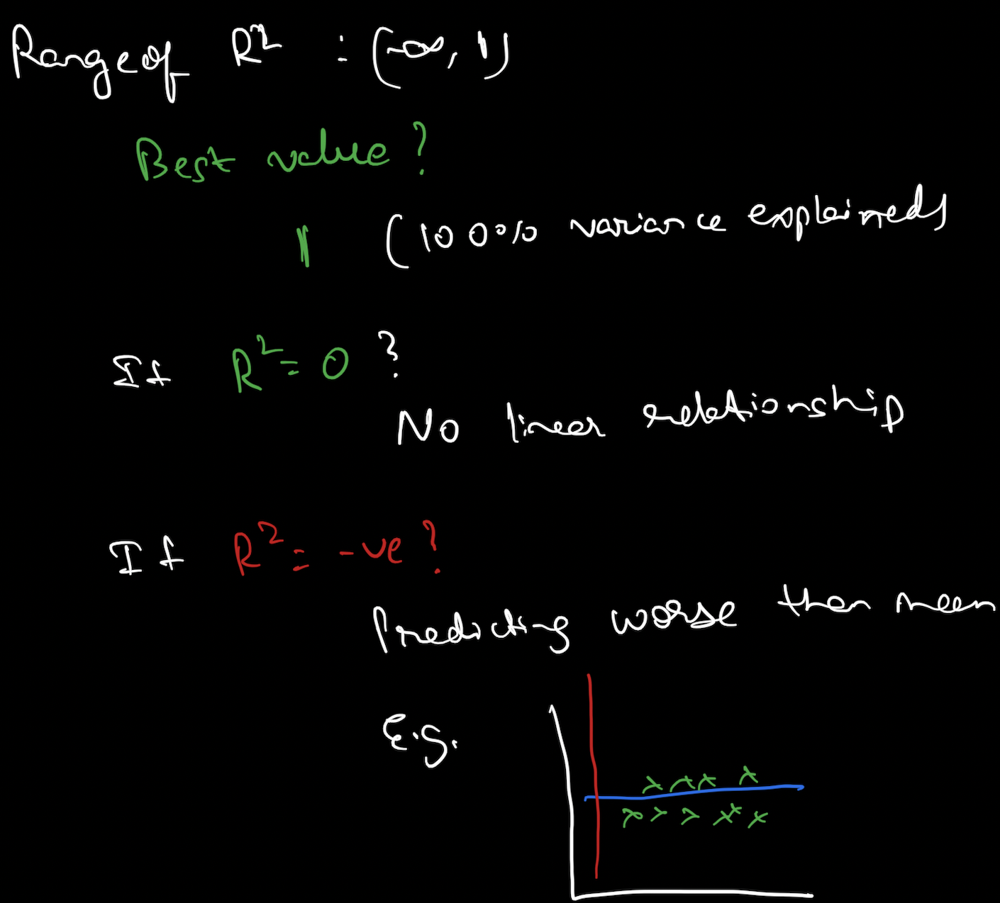

#### What would be the best value of R2 score?

When $SS_{res}=0$, </br>
i.e., R2 = 1

\
#### What if the R2 score is 0?

That means $SS_{res} = SS_{total}$,
- this means no linear relationship.

\
#### What if the R2 score is negative?

This would mean our model is predicting even worse than taking mean as the predicted value.

\
Example -
- You have all horizontal points,
- but the model's line is vertical.

**Quiz** (Check your knowledge)

```
Q: Multiple models built to predict the trend behind cyber attacks on a company, have R2 scores of 0.1, 0.3, 0.5, 0.9.
Which would be the best model to use?

a) 0.1
b) 0.3
c) 0.5
d) 0.9

A: d) 0.9
```

#### What would be a good R2 value then?

\
Well, it is highly problem dependent
- but the closer the score is to 1,
- the better is the model able to follow the trend in the data.

#### Let's check the performance of our previously trained model on test data.

\
LinearRegression's default `.score()` function uses R2 score to evaluate the data.

In [ ]:
model.score(X_train, y_train)

0.9459004943250285

In [ ]:
model.score(X_test, y_test)

0.945987722055055

## Model Interpretability

### Understanding our model -

Now that we have built our model,
- how can we make some sense out of it?

\
Let's say the weights of `age` and `odometer` are
- -10000 and 10 respectively.

\
#### What do these weights signify?

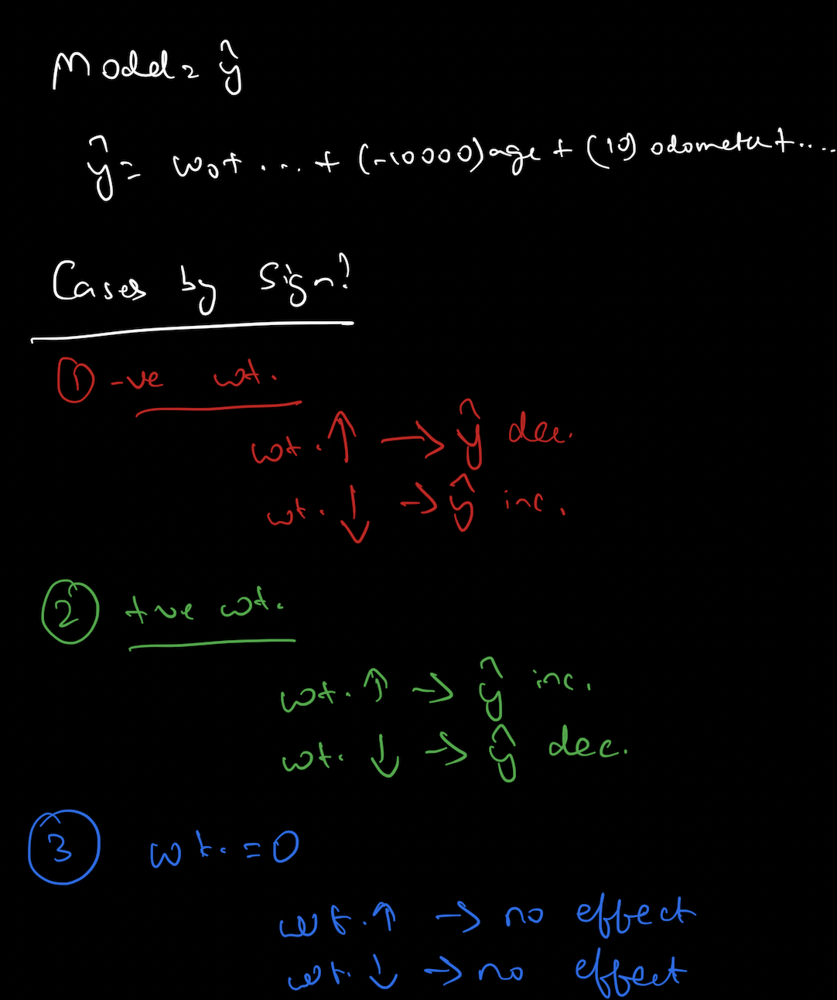

Let's understand this in two ways:

#### By way of sign

Cases:
1. Weight is negative
  - Assume the odometer reading has a negative weight attached to it.
  - As the weight increases, the value decreases.
  - Thus, increasing the value of odometer reading will decrease the predicted value, and vice versa.
2. Weight is positive
  - Now let's assume model has a positive weight.
  - How will the predicted value get affected?
  - Increase the value of model, the price increases, and vice versa.
3. Weight is zero
  - What if the weight is 0?
  - Well, then you can increase or decrease, the value won't get affected at all.
  - In short, this feature is of least importance to the prediction.



#### By way of magnitude

Let's take the `age` and `odometer`:

- By increasing age by 1,
  - the predicted value will decrease by 10000
- By decreasing odometer by 1,
  - the predicted value will decrease by 10

\
So, higher the magnitude, or the absolute value, more important the feature.



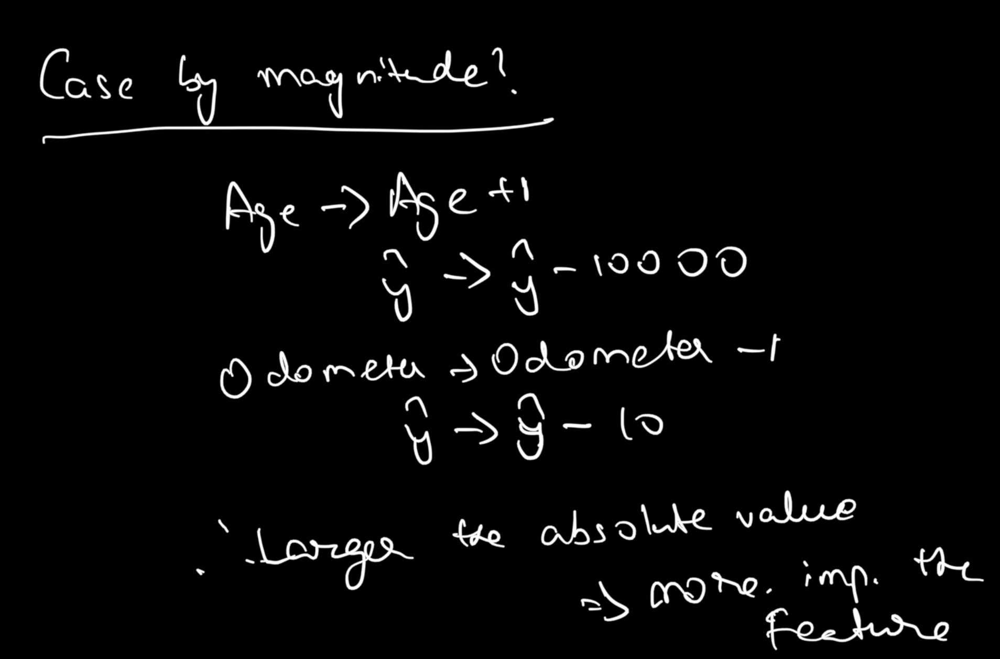

**Quiz** (What do you think?)

```
Q: Feature importance in linear regression is determined by:

a) The magnitude of the regression coefficients.
b) The number of observations in the dataset.
c) The correlation between the independent variables.
d) The average squared difference between the predicted and actual values.

A: a) The magnitude of the regression coefficients.
```

#### Then how do we find the most important feature?

\
We simply take the absolute value of all the weights,
- and the highest value's feature is the most important.

But there is one issue with taking the absolute value.

\
As we saw, `age` feature is more influential than `odometer reading`.

But notice,
- both have different units:
  - age is measured in years,
  - while odometer reading in kms.
- We can't compare years with kms.

\
#### How can we solve this?

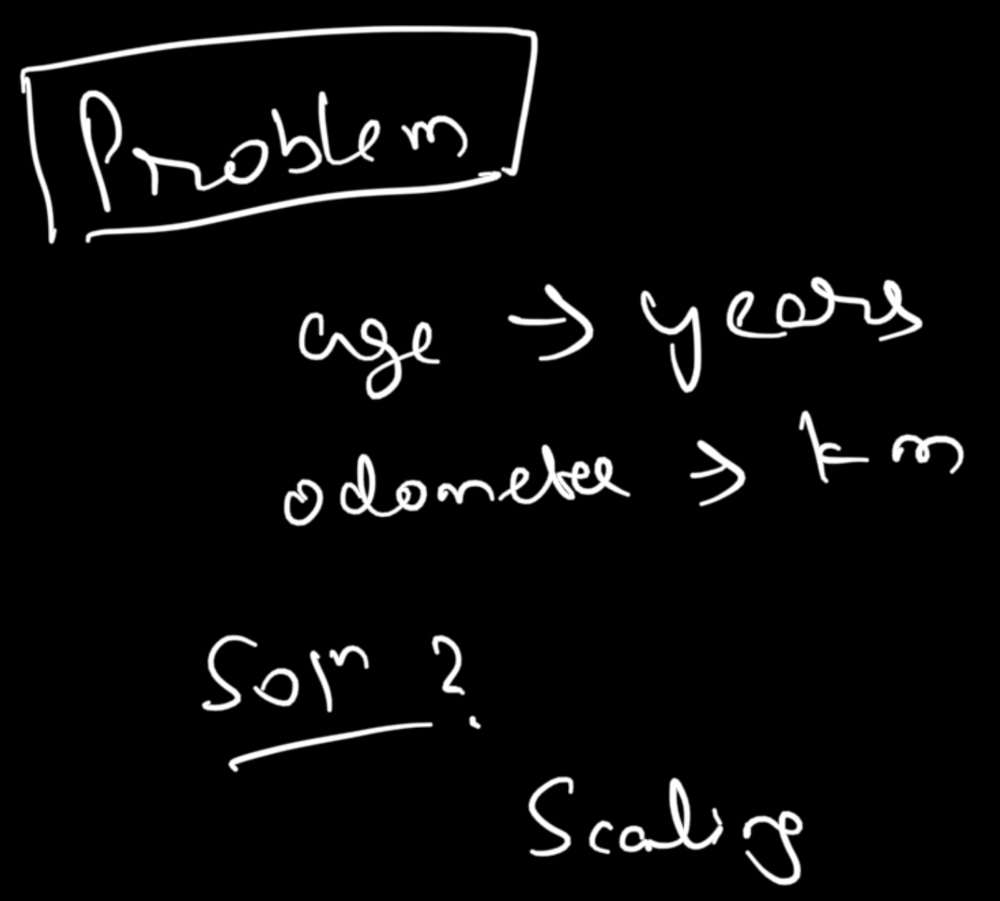

Do you remember we did a certain preprocessing step before training our model?
- Scaling!

\
With the help of scaling,
- we can bring the data to the same scale,
- and thus make it easy to understand the feature importance.

#### So which feature do you think is the most important in our case?

In [ ]:
model.coef_

array([ 7.23382199e+11, -2.50488281e-01, -2.32558310e-01,  7.39953774e-02,
        4.68742062e-02,  7.23382199e+11,  6.61604471e-02,  8.58973267e-01,
       -7.18488746e-03, -7.03116019e-03,  6.98577387e-03,  1.32957359e-01,
        1.50077817e-02, -6.83704171e-03, -3.69616522e-03, -1.62563011e-02,
       -2.35725832e-02])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16]),
 [Text(0, 0, 'year'),
  Text(1, 0, 'km_driven'),
  Text(2, 0, 'mileage'),
  Text(3, 0, 'engine'),
  Text(4, 0, 'max_power'),
  Text(5, 0, 'age'),
  Text(6, 0, 'make'),
  Text(7, 0, 'model'),
  Text(8, 0, 'Individual'),
  Text(9, 0, 'Trustmark Dealer'),
  Text(10, 0, 'Diesel'),
  Text(11, 0, 'Electric'),
  Text(12, 0, 'LPG'),
  Text(13, 0, 'Petrol'),
  Text(14, 0, 'Manual'),
  Text(15, 0, '5'),
  Text(16, 0, '>5')])

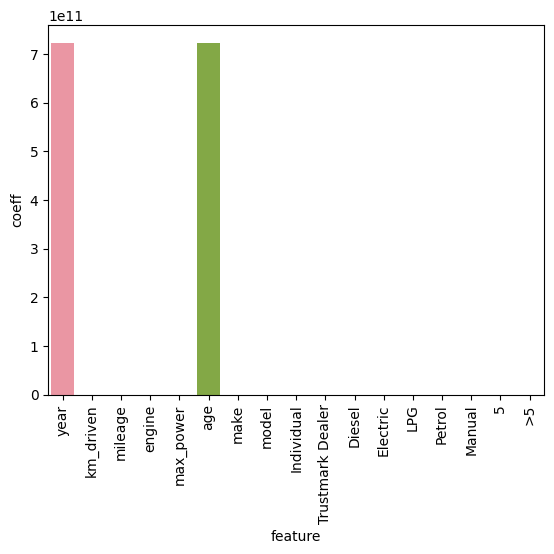

In [ ]:
import seaborn as sns

imp = pd.DataFrame(list(zip(X_test.columns,np.abs(model.coef_))),
                   columns=['feature', 'coeff'])
sns.barplot(x='feature', y='coeff', data=imp)
plt.xticks(rotation=90)

In [ ]:
X_test.columns[np.argmax(np.abs(model.coef_))]

'year'

In [ ]:
X_test.columns[np.argmin(np.abs(model.coef_))]

'Manual'

So,
- `year` is most important feature,
- while `manual` is the least important.